<img src="./logo_UTN.svg" align="right" width="150" />

### Documentación Procesamiento estadístico

# Clasificacion set de datos en función de TTO y Grado de Lateralización
#### Lucas Bautista



## Hipótesis de Partida

A priori se supone que tanto las magnitudes ATT/total e IODTT/total son coeficientes vinculados a la lateralización, por lo que pre-suponemos que nuestro mensurando es obtenido a partir de dos métodos distintos, es decir estamos en presencia de dos variables las cuales se encargan de medir exactamente la misma magnitud. Dado a que se trata de coeficientes normalizados con el total(es decir no poseen unidades y su rango de valores comprendidos es de 0 a 100%). y sabiendo que la forma de medición se realizó con un procedimiento humano ayudándose con herramientas computarizadas, dicha información nos da la pauta de que si analizamos ambas variables y la relación que guardan ante ellas, deberíamos encontrar una fuerte correlación lineal.

Mas no así no podemos decir nada a priori a partir de si es posible establecer un modelo lineal entre las mismas, dichas afirmaciones deberán comprobarse mediante el análisis de las hipótesis del modelo lineal, las cuales implican, de forma principal y verificable, un estudio de normalidad en los set de datos y homocedasticidad.

tampoco podemos suponer cuál será la naturaleza de los set de datos formados a partir de la clasificación, puesto que los ejemplos son muy limitados en número. Razón por la cual un estudio de factibilidad para determinar un modelo lineal resulta innecesario y se procederá directamente al análisis de sus histogramas a fin de encontrar modos que permitan definir umbrales de clasificación, dichos umbrales compondrán a futuro las etiquetas en los ejemplos para entrenar a la red.

Sabemos que el tipo de tratamiento será influyente respecto al grado de lateralización, es esperable que ante distintos tipos de experimento en **Control el grado de lateralización fluctúara entre todos los valores**,por otro lado se sabe que la Melatonina(MEL), desfavorece a la lateralización del tejido,razón por la cual **para MEL esperamos valores de lateralización bajos,"i.e" ratios de ATT altos** por el contrario la **Luzindole(LUZ) tiene el efecto contrario de la Melatonina**, por lo que quizás encontremos valores bajos de ATT y una mayor lateralización, finalmente ante la mezcla de melatonina y luzindole. esperamos que estos se anulen y sea equivalente a control, en términos de ATT, posiblemente se tomen valores muy dispersos

## Set de Datos (data_celulas.csv)

El archivo que contiene el set de datos, es en realidad, un mapa el cual permite conocer no solo la ubicación de la captura de la célula dentro de la base de datos, sino que además brinda información respecto a parámetros vinculados con su grado de lateralización, así como también condiciones en las que se realizó el experimento, condiciones de la muestra y tipo de tratamiento aplicada a la misma.

**DIR**: Corresponde al directorio en el cual se encuentra la captura de la célula, podemos encontrar dos grupos bien diferenciados **X20** y **X40** esto se debe a que existen capturas tomadas con una distinto aumento de microscopio, siendo **X20** un aumento de 20 veces y **X40** un aumento de 40 veces. por lo que es esperable que las capturas de X20 cubran mayor superficie de la célula a las de X40.

**SNAP**: el el código asignado a la captura, o bien parte del nombre del archivo, con parte se refiere a que en la misma no se especifica el formato, razón por la cual se implementa la función **open_image**.

**AREA_TT_OV_TOTAL(ATT/TOTAL)**: parámetro proporcional a la lateralización medida en relación al área de célula en término terminal(periferia) respecto al área total de la misma

**IOD_OV_TOTAL(IODTT/TOTAL)**: parámetro proporcional a la lateralización medida en relación a la intensidad lumínica de pixeles en término terminal(periferia) respecto a la intensidad lumínica total

**periodo exptal**: Condiciones a las que se somete el tejido a la hora de realizar el experimento, dichas condiciones también información respecto al tiempo transcurrido

**TTO**: tipo de tratamiento sobre el tejido, en este identificamos 4 grandes grupos(control,Mel,Luz y Mel+Luz)

Aquellos argumentos que figuran como '*nan*' son argumentos que no fueron completados por los cual los tomamos como atributos desconocidos


In [13]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from scipy import stats
import statsmodels.api as sm
import cv2
import sys

#%% Funciones: Filtrado de String y normalizacion de datos
def is_number(s):
    try:
        float(s)
        return True
    except ValueError:
        pass
 
    try:
        import unicodedata
        unicodedata.numeric(s)
        return True
    except (TypeError, ValueError):
        pass
 
    return False

def norm_data(data):
    return (data-data.mean())/data.std()

def open_image(path):
    image = cv2.imread(path + ".jpg")
    if (image is None):
        image = cv2.imread(path + ".png")
        if(image is None):
            image = cv2.imread(path + ".tif")
            if(image is None):
                sys.exit("%s___no se pudo read"%(path))
    return image

def clasificador(data,list_class,name_class):
    #quiero devolver un vector,con los datos en funcion de la clase
    output = []
    for i in range(0,data.size):
        if(list_class[i]==list_class[i]):
            if(name_class == list_class[i]):
                output.append(np.array([data[i]]))
    return output


SMALL_SIZE = 8
MEDIUM_SIZE = 10
BIGGER_SIZE = 12

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

#%% Carga De Datos
df = pd.read_csv("data_celulas.csv")
n_df = df[['AREA_TT_OV_TOTAL','IOD_TT_OV_TOTAL']]
Area_TT_sobre_Total = np.array(df.AREA_TT_OV_TOTAL)
IOD_TT_total = np.array(df.IOD_TT_OV_TOTAL)
Classes = np.array(df.TTO)
snaps_id = np.array(df.SNAP);
paths = 'data' + '/train'+'/'+np.array(df.DIR)+'/'+snaps_id

#%% Filtrado de Datos
IOD_TT_total_filter = []
Area_TT_sobre_Total_filter = []
aty_paths_list = []
scatter = []
flag_1 = 0
flag_2 = 0

#filtro los datos que no esten completos extraigo los numeros y armo el vector para el scatter
for i in range(0,IOD_TT_total.size):
    #me fijo de que no sea un nan
    if(IOD_TT_total[i]==IOD_TT_total[i]):
        #si no es un nan ahora me fijo que corresponda a un numero
        if(is_number(IOD_TT_total[i])):
            #corresponde a un numero entonces lo guardo
            flag_1 = 1
            temp_n1 = float(IOD_TT_total[i])
            IOD_TT_total_filter.append([temp_n1,i,Classes[i],snaps_id[i],paths[i]])
    #me fijo de que no sea un nan
    if(Area_TT_sobre_Total[i]==Area_TT_sobre_Total[i]):
        #si no es un nan ahora me fijo que corresponda a un numero
        if(is_number(Area_TT_sobre_Total[i])):
            #corresponde a un numero entonces lo guardo
            flag_2 = 1
            temp_n2 = float(Area_TT_sobre_Total[i])
            Area_TT_sobre_Total_filter.append([temp_n2,i,Classes[i],snaps_id[i],paths[i]])
    
    if(flag_1!=0 and flag_2 !=0):
        #significa que ambos son numeros
        ##aca me tengo que guardar el directorio, cosa de ir a buscar los atipicos despues
        scatter.append(np.array([temp_n2,temp_n1,i,Classes[i],snaps_id[i],paths[i]]))
        aty_paths_list.append(paths[i])
    #reseteo los flags
    flag_1 = 0
    flag_2 = 0


IOD_TT_total_filter = np.array(IOD_TT_total_filter).transpose()
Area_TT_sobre_Total_filter = np.array(Area_TT_sobre_Total_filter).transpose()
scatter = np.array(scatter).transpose()

#%% me mquedo solo con los datos, para el procesamiento

IOD_TT_total_filter_data = np.array([IOD_TT_total_filter[0]]).astype(np.float64)[0]
Area_TT_sobre_Total_filter_data = np.array([Area_TT_sobre_Total_filter[0]]).astype(np.float64)[0]
scatter_data = np.array([scatter[0],scatter[1]]).astype(np.float64)

#mostrar algunos elementos de la tabla
df[['DIR','SNAP','AREA_TT_OV_TOTAL','IOD_TT_OV_TOTAL','perido exptal','TTO']]

,DIR,SNAP,AREA_TT_OV_TOTAL,IOD_TT_OV_TOTAL,perido exptal,TTO
0,x20,SNAP-084411-0015,45.40,45.6,25´recup,control
1,x20,SNAP-084919-0018,38.33,- RELEER,25´recup,control
2,x20,SNAP-084437-0016,31.01,32.86,25´recup,control
3,x40,SNAP-191920-0004,71.76,71.44,25´recup,control
4,x40,SNAP-191751-0001,79.25,80.09,25´recup,control
5,x20,SNAP-091746-0036,57.44,58.38,25´recup,control
6,x20,SNAP-090416-0028,56.17,56.90,25´recup,control
7,x20,SNAP-090157-0024,37.32,37.95,25´recup,control
8,x20,SNAP-084919-0018,38.33,NaN,25´recup,control
9,x20,SNAP-084949-0020,33.28,33.29,25 min,control


# Clasificación según Tratamientos (TTO)

Visualizamos los histogramas, según el tipo de tratamiento empleado, a fin de poder establecer un umbral en al menos 2 grados de lateralización, basándonos en las hipótesis de los efectos que estos tienen sobre el tejido.

para ello se ilustran los histogramas solapados para ambos parámetros de medición, clasificados según el tipo de tratamiento al que se está sometiendo la muestra, en el eje vertical se obtienen los valores del parámetro de lateralización mientras que en el eje horizontal se muestra la frecuencia de repetición de los datos. La misma no está ligada a la cantidad de muestras ya que existen muestras en las que se midieron estos parámetros y en otras algunos fueron medidos y otros no, ver Tabla I. 

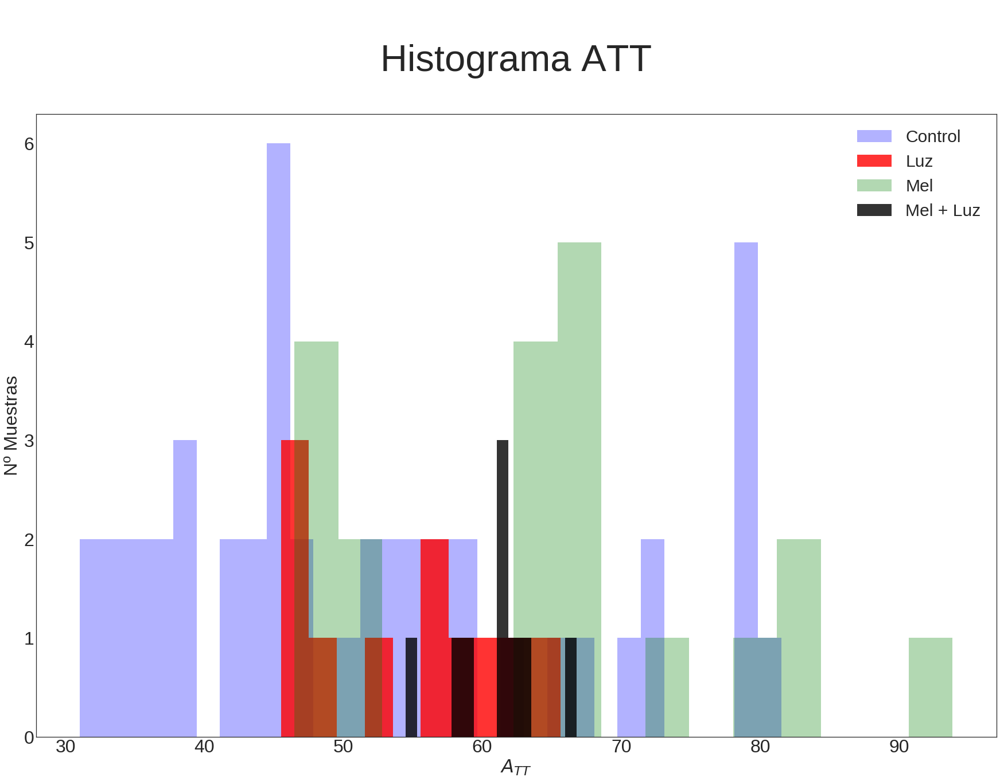

In [14]:
#%% Clasificacion de clases

data_control =          (np.array(Area_TT_sobre_Total_filter[0]['control' == Area_TT_sobre_Total_filter[2]]).astype(np.float64),
                         np.array(Area_TT_sobre_Total_filter[1]['control' == Area_TT_sobre_Total_filter[2]]).astype(np.int),
                         Area_TT_sobre_Total_filter[3]['control' == Area_TT_sobre_Total_filter[2]],
                         Area_TT_sobre_Total_filter[4]['control' == Area_TT_sobre_Total_filter[2]])

data_MEL =              (np.array(Area_TT_sobre_Total_filter[0]['Mel' == Area_TT_sobre_Total_filter[2]]).astype(np.float64),
                        np.array(Area_TT_sobre_Total_filter[1]['Mel' == Area_TT_sobre_Total_filter[2]]).astype(np.int),
                        Area_TT_sobre_Total_filter[3]['Mel' == Area_TT_sobre_Total_filter[2]],
                        Area_TT_sobre_Total_filter[4]['Mel' == Area_TT_sobre_Total_filter[2]])

data_LUZ =              (np.array(Area_TT_sobre_Total_filter[0]['Luz' == Area_TT_sobre_Total_filter[2]]).astype(np.float64),
                        np.array(Area_TT_sobre_Total_filter[1]['Luz' == Area_TT_sobre_Total_filter[2]]).astype(np.int),
                        Area_TT_sobre_Total_filter[3]['Luz' == Area_TT_sobre_Total_filter[2]],
                        Area_TT_sobre_Total_filter[4]['Luz' == Area_TT_sobre_Total_filter[2]])

data_MELplusLUZ =      (np.array(Area_TT_sobre_Total_filter[0]['Mel+Luz' == Area_TT_sobre_Total_filter[2]]).astype(np.float64),
                        np.array(Area_TT_sobre_Total_filter[1]['Mel+Luz' == Area_TT_sobre_Total_filter[2]]).astype(np.int),
                        Area_TT_sobre_Total_filter[3]['Mel+Luz' == Area_TT_sobre_Total_filter[2]],
                        Area_TT_sobre_Total_filter[4]['Mel+Luz' == Area_TT_sobre_Total_filter[2]])

plt.figure(figsize=(30,20))
plt.rc('font', size=365)          # controls default text sizes
plt.rc('axes', titlesize=65)     # fontsize of the axes title
plt.rc('axes', labelsize=32)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=32)    # fontsize of the tick labels
plt.rc('ytick', labelsize=32)    # fontsize of the tick labels
plt.rc('legend', fontsize=30)    # legend fontsize
plt.style.use('seaborn-white')
plt.title('\nHistograma ATT\n')
plt.hist(data_control[0],bins=30,alpha = 0.3,histtype='stepfilled',color='blue',
         orientation='vertical',label='Control')
plt.hist(data_LUZ[0],bins=10,alpha = 0.8,histtype='bar',color = 'red',
        orientation='vertical',label='Luz')
plt.hist(data_MEL[0],bins=15,alpha = 0.3,histtype='stepfilled',color = 'green',
        orientation='vertical',label='Mel')
plt.hist(data_MELplusLUZ[0],bins=15,alpha = 0.8,histtype='bar',color = 'black',
         orientation='vertical',label='Mel + Luz')
plt.xlabel("$A_{TT}$")
plt.ylabel("Nº Muestras")
plt.legend()
plt.show()
#deuelvo los parametros por defecto de las figuras
plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

# Separación de Muestras lateralizadas y no lateralizadas:

Una vez clasificado el set de datos en función del tipo de tratamiento es necesario emplear un criterio para así distinguir las muestras de cada tratamiento y ordenarlas según su lateralización o no lateralización. dado que el objetivo de este trabajo consiste en automatizar dicho proceso, realizar la tarea antes propuesta no es trivial.


Como una solución se decide, establecer un umbral empírico de ATT/Total basado en la experiencia y el conocimiento del patólogo experto, en el cual, todas aquellas muestras cuyo ratio de área termino terminal sobre el total sea **superior al 65% se las considerara no lateralizadas** por el contrario, aquellas mediciones en donde el ratio sea **inferior al 48%, se tomarán como lateralizadas**, independientemente del tipo de tratamiento empleado.

A fin de poder adquirir experiencia y la habilidad del patólogo experto para reconocer las muestras, se ilustran las imágenes que presentan los casos cercanos a los umbrales de lateralización y no lateralización, en las mismas se adjunta el valor de ratio, su tipo de tratamiento y su codigo de identificacion.

In [15]:
#separamos en funcion de su graddo de laterlacion

lat = 48; #todo valor por debajo de 48 esta lateralizado
no_lat = 65 #todo valor por encima de not_lat lo considero no_laterlaziado




data_control_notlat = (data_control[0][data_control[0]>no_lat],
                       data_control[1][data_control[0]>no_lat],
                       data_control[2][data_control[0]>no_lat],
                       data_control[3][data_control[0]>no_lat])

data_control_lat =      (data_control[0][data_control[0]<lat],
                         data_control[1][data_control[0]<lat],
                         data_control[2][data_control[0]<lat],
                         data_control[3][data_control[0]<lat])


data_MEL_notlat =       (data_MEL[0][data_MEL[0]>no_lat],
                         data_MEL[1][data_MEL[0]>no_lat],
                         data_MEL[2][data_MEL[0]>no_lat],
                         data_MEL[3][data_MEL[0]>no_lat])
                         

data_MEL_lat =          (data_MEL[0][data_MEL[0]<lat],
                         data_MEL[1][data_MEL[0]<lat],
                         data_MEL[2][data_MEL[0]<lat],
                         data_MEL[3][data_MEL[0]<lat])

data_LUZ_notlat =       (data_LUZ[0][data_LUZ[0]>no_lat],
                         data_LUZ[1][data_LUZ[0]>no_lat],
                         data_LUZ[2][data_LUZ[0]>no_lat],
                         data_LUZ[3][data_LUZ[0]>no_lat])

data_LUZ_lat =           (data_LUZ[0][data_LUZ[0]<lat],
                         data_LUZ[1][data_LUZ[0]<lat],
                         data_LUZ[2][data_LUZ[0]<lat],
                         data_LUZ[3][data_LUZ[0]<lat])

data_MELplusLUZ_notlat = (data_MELplusLUZ[0][data_MELplusLUZ[0]>no_lat],
                          data_MELplusLUZ[1][data_MELplusLUZ[0]>no_lat],
                          data_MELplusLUZ[2][data_MELplusLUZ[0]>no_lat],
                          data_MELplusLUZ[3][data_MELplusLUZ[0]>no_lat])

data_MELplusLUZ_lat =    (data_MELplusLUZ[0][data_MELplusLUZ[0]<lat],
                          data_MELplusLUZ[1][data_MELplusLUZ[0]<lat],
                          data_MELplusLUZ[2][data_MELplusLUZ[0]<lat],
                          data_MELplusLUZ[3][data_MELplusLUZ[0]<lat])


#separamon en funcion del caso extremo

#control
control_lat_x = (open_image(data_control[3][np.argmin(data_control[0])]), #imagen
                             data_control[2][np.argmin(data_control[0])], #snap_id
                             np.min(data_control[0]))                       #valor de ATT

control_notlat_x = (open_image(data_control[3][np.argmax(data_control[0])]),
                            data_control[2][np.argmax(data_control[0])],
                                np.max(data_control[0]))




MEL_lat_x = (open_image(data_MEL[3][np.argmin(data_MEL[0])]),
                         data_MEL[2][np.argmin(data_MEL[0])],
                         np.min(data_MEL[0]))

MEL_notlat_x = (open_image(data_MEL[3][np.argmax(data_MEL[0])]),
                        data_MEL[2][np.argmax(data_MEL[0])],
                                np.max(data_MEL[0]))




LUZ_lat_x = (open_image(data_LUZ[3][np.argmin(data_LUZ[0])]),
                         data_LUZ[2][np.argmin(data_LUZ[0])],
                         np.min(data_LUZ[0]))

LUZ_notlat_x = (open_image(data_LUZ[3][np.argmax(data_LUZ[0])]),
                        data_LUZ[2][np.argmax(data_LUZ[0])],
                                np.max(data_LUZ[0]))




MELplusLUZ_lat_x = (open_image(data_MELplusLUZ[3][np.argmin(data_MELplusLUZ[0])]),
                         data_MELplusLUZ[2][np.argmin(data_MELplusLUZ[0])],
                         np.min(data_MELplusLUZ[0]))

MELplusLUZ_notlat_x = (open_image(data_MELplusLUZ[3][np.argmax(data_MELplusLUZ[0])]),
                           data_MELplusLUZ[2][np.argmax(data_MELplusLUZ[0])],
                                np.max(data_MELplusLUZ[0]))

Advertencia se reemplazo el valor de MELplusLUZ lat por su caso extremo


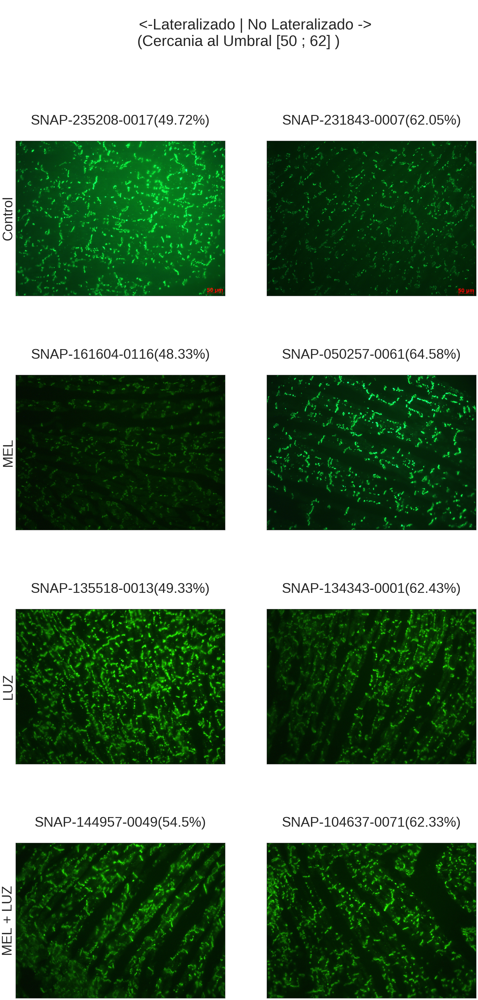

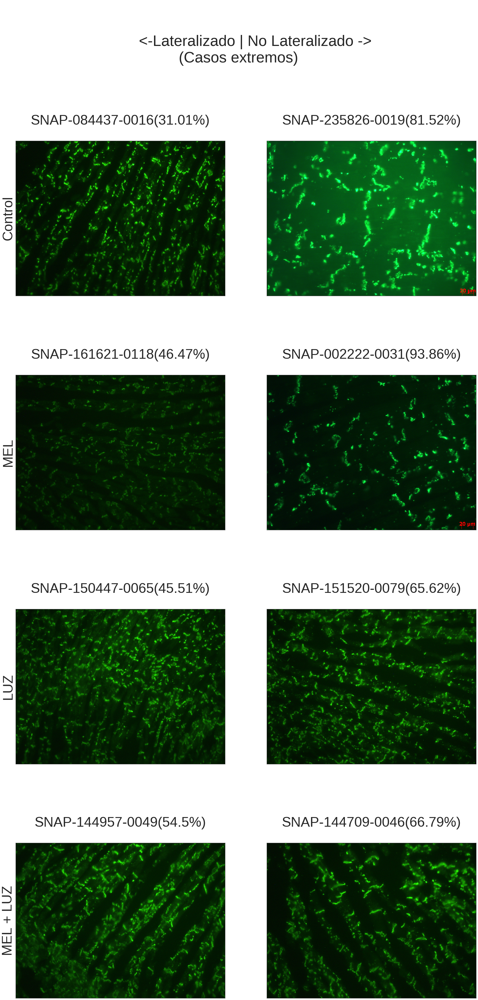

In [16]:
## graficamos muestras de casos cercanos a los umbrales propuestos,en caso de que no exista una muestra dentro dentro
#de ese umbral reemplazamos por su caso mas extremos

#control_lat
if np.size(data_control_lat)>0:
    control_lat = (open_image(data_control_lat[3][np.argmax(data_control_lat[0])]),
                   data_control_lat[2][np.argmax(data_control_lat[0])],
                   np.max(data_control_lat[0]))
else:
    print("Advertencia se reemplazo el valor de control lat por su caso extremo");
    control_lat = control_lat_x
#control_notlat
if np.size(data_control_notlat)>0:
    control_notlat = (open_image(data_control_notlat[3][np.argmin(data_control_notlat[0])]),
                      data_control_notlat[2][np.argmin(data_control_notlat[0])],
                      np.min(data_control_notlat[0]))
else:
    print("Advertencia se reemplazo el valor de control notlat por su caso extremo");
    control_notlat = control_notlat_x
    


#LUZ_lat
if np.size(data_LUZ_lat)>0:
    LUZ_lat = (open_image(data_LUZ_lat[3][np.argmax(data_LUZ_lat[0])]),
                   data_LUZ_lat[2][np.argmax(data_LUZ_lat[0])],
                   np.max(data_LUZ_lat[0]))
else:
    print("Advertencia se reemplazo el valor de LUZ lat por su caso extremo");
    LUZ_lat = LUZ_lat_x
#control_notlat
if np.size(data_LUZ_notlat)>0:
    LUZ_notlat = (open_image(data_LUZ_notlat[3][np.argmin(data_LUZ_notlat[0])]),
                      data_LUZ_notlat[2][np.argmin(data_LUZ_notlat[0])],
                      np.min(data_LUZ_notlat[0]))
else:
    print("Advertencia se reemplazo el valor de control notlat por su caso extremo");
    LUZ_notlat = LUZ_notlat_x
    
    
    
    
    
#MEL_lat
if np.size(data_MEL_lat)>0:
    MEL_lat = (open_image(data_MEL_lat[3][np.argmax(data_MEL_lat[0])]),
                   data_MEL_lat[2][np.argmax(data_MEL_lat[0])],
                   np.max(data_MEL_lat[0]))
else:
    print("Advertencia se reemplazo el valor de MEL lat por su caso extremo");
    MEL_lat = MEL_lat_x
#control_notlat
if np.size(data_MEL_notlat)>0:
    MEL_notlat = (open_image(data_MEL_notlat[3][np.argmin(data_MEL_notlat[0])]),
                      data_MEL_notlat[2][np.argmin(data_MEL_notlat[0])],
                      np.min(data_MEL_notlat[0]))
else:
    print("Advertencia se reemplazo el valor de MEL notlat por su caso extremo");
    MEL_notlat = MEL_notlat_x

    
    
    
#LUZ + MEL lat
if np.size(data_MELplusLUZ_lat)>0:
    MELplusLUZ_lat = (open_image(data_MELplusLUZ_lat[3][np.argmax(data_MELplusLUZ_lat[0])]),
                   data_MELplusLUZ_lat[2][np.argmax(data_MELplusLUZ_lat[0])],
                   np.max(data_MELplusLUZ_lat[0]))
else:
    print("Advertencia se reemplazo el valor de MELplusLUZ lat por su caso extremo");
    MELplusLUZ_lat = MELplusLUZ_lat_x
#control_notlat
if np.size(data_MELplusLUZ_notlat)>0:
    MELplusLUZ_notlat = (open_image(data_MELplusLUZ_notlat[3][np.argmin(data_MELplusLUZ_notlat[0])]),
                      data_MELplusLUZ_notlat[2][np.argmin(data_MELplusLUZ_notlat[0])],
                      np.min(data_MELplusLUZ_notlat[0]))
else:
    print("Advertencia se reemplazo el valor de MELplusLUZ notlat por su caso extremo");
    MELplusLUZ_notlat = MELplusLUZ_notlat_x

    
    
    
fig,axs = plt.subplots(4,2)

for ax in axs.flat:
    ax.set(xticks=[], yticks=[])
  
    
fig.set_size_inches(30,60)
fig.suptitle("\n        <-Lateralizado | No Lateralizado ->\n(Cercania al Umbral [%s ; %s] )"%(lat,no_lat),fontsize=55)

fontsize_titles = 50
fontsize_ylabels = 50
fontsize_xlabels = 50

axs[0,0].imshow(control_lat[0][:,:,::-1])
axs[0,0].set_title("\n%s(%s%%)\n"%(control_lat[1],control_lat[2]),fontsize = fontsize_titles)
axs[0,0].set_ylabel(ylabel='Control',fontsize=fontsize_ylabels)


axs[0,1].imshow(control_notlat[0][:,:,::-1])
axs[0,1].set_title("\n%s(%s%%)\n"%(control_notlat[1],control_notlat[2]),fontsize = fontsize_titles)


axs[1,0].imshow(MEL_lat[0][:,:,::-1])
axs[1,0].set_title("\n%s(%s%%)\n"%(MEL_lat[1],MEL_lat[2]),fontsize = fontsize_titles)
axs[1,0].set_ylabel(ylabel='MEL',fontsize=fontsize_ylabels)

axs[1,1].imshow(MEL_notlat[0][:,:,::-1])
axs[1,1].set_title("\n%s(%s%%)\n"%(MEL_notlat[1],MEL_notlat[2]),fontsize = fontsize_titles)



axs[2,0].imshow(LUZ_lat[0][:,:,::-1])
axs[2,0].set_title("\n%s(%s%%)\n"%(LUZ_lat[1],LUZ_lat[2]),fontsize = fontsize_titles)
axs[2,0].set_ylabel(ylabel='LUZ',fontsize=fontsize_ylabels)

axs[2,1].imshow(LUZ_notlat[0][:,:,::-1])
axs[2,1].set_title("\n%s(%s%%)\n"%(LUZ_notlat[1],LUZ_notlat[2]),fontsize = fontsize_titles)



axs[3,0].imshow(MELplusLUZ_lat[0][:,:,::-1])
axs[3,0].set_title("\n%s(%s%%)\n"%(MELplusLUZ_lat[1],MELplusLUZ_lat[2]),fontsize = fontsize_titles)
axs[3,0].set_ylabel(ylabel='MEL + LUZ',fontsize=fontsize_ylabels)

axs[3,1].imshow(MELplusLUZ_notlat[0][:,:,::-1])
axs[3,1].set_title("\n%s(%s%%)\n"%(MELplusLUZ_notlat[1],MELplusLUZ_notlat[2]),fontsize = fontsize_titles)

plt.show();



fig,axs = plt.subplots(4,2)

for ax in axs.flat:
    ax.set(xticks=[], yticks=[])
  
    
fig.set_size_inches(30,60)
fig.suptitle("\n\n        <-Lateralizado | No Lateralizado ->\n(Casos extremos)",fontsize=55)

fontsize_titles = 50
fontsize_ylabels = 50
fontsize_xlabels = 50

axs[0,0].imshow(control_lat_x[0][:,:,::-1])
axs[0,0].set_title("\n%s(%s%%)\n"%(control_lat_x[1],control_lat_x[2]),fontsize = fontsize_titles)
axs[0,0].set_ylabel(ylabel='Control',fontsize=fontsize_ylabels)


axs[0,1].imshow(control_notlat_x[0][:,:,::-1])
axs[0,1].set_title("\n%s(%s%%)\n"%(control_notlat_x[1],control_notlat_x[2]),fontsize = fontsize_titles)


axs[1,0].imshow(MEL_lat_x[0][:,:,::-1])
axs[1,0].set_title("\n%s(%s%%)\n"%(MEL_lat_x[1],MEL_lat_x[2]),fontsize = fontsize_titles)
axs[1,0].set_ylabel(ylabel='MEL',fontsize=fontsize_ylabels)

axs[1,1].imshow(MEL_notlat_x[0][:,:,::-1])
axs[1,1].set_title("\n%s(%s%%)\n"%(MEL_notlat_x[1],MEL_notlat_x[2]),fontsize = fontsize_titles)



axs[2,0].imshow(LUZ_lat_x[0][:,:,::-1])
axs[2,0].set_title("\n%s(%s%%)\n"%(LUZ_lat_x[1],LUZ_lat_x[2]),fontsize = fontsize_titles)
axs[2,0].set_ylabel(ylabel='LUZ',fontsize=fontsize_ylabels)

axs[2,1].imshow(LUZ_notlat_x[0][:,:,::-1])
axs[2,1].set_title("\n%s(%s%%)\n"%(LUZ_notlat_x[1],LUZ_notlat_x[2]),fontsize = fontsize_titles)



axs[3,0].imshow(MELplusLUZ_lat_x[0][:,:,::-1])
axs[3,0].set_title("\n%s(%s%%)\n"%(MELplusLUZ_lat_x[1],MELplusLUZ_lat_x[2]),fontsize = fontsize_titles)
axs[3,0].set_ylabel(ylabel='MEL + LUZ',fontsize=fontsize_ylabels)

axs[3,1].imshow(MELplusLUZ_notlat_x[0][:,:,::-1])
axs[3,1].set_title("\n%s(%s%%)\n"%(MELplusLUZ_notlat_x[1],MELplusLUZ_notlat_x[2]),fontsize = fontsize_titles)

plt.show();